In [1]:
%load_ext autoreload
%autoreload 2

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from data_loader import load_xenium_breast_cancer
from utils import plot_factors_covariate_2d

from famo.core import CORE
from famo.plotting import plot_training_curve

In [2]:
data = load_xenium_breast_cancer()

/data/walter/miniconda3/envs/famo/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/data/walter/miniconda3/envs/famo/lib/python3.12/site-packages/anndata/_core/anndata.py:1820: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [8]:
data['group_scrna']['rna'].X = data['group_scrna']['rna'].layers['counts']
data['group_spatial']['rna'].X = data['group_spatial']['rna'].layers['raw']

In [203]:
prismo_model = CORE(device="cuda:0")
prismo_model.fit(
    data=data,
    n_factors=10,
    weight_prior="Normal",
    factor_prior={"group_spatial" : "GP", "group_scrna" : "Normal"},
    likelihoods="GammaPoisson",
    covariates_obsm_key={"group_spatial" : "spatial", "group_scrna" : None},
    max_epochs=3000,
    early_stopper_patience=20,
    lr=5e-2,
    plot_data_overview=False,
    save=True,
    save_path="prismo_gammapoisson_nonnegative",
    init_scale=0.1,
    gp_n_inducing=2000,
    seed=5432,
    batch_size=15000,
    print_every=1,
)

#prismo_model = load_model("prismo_spatial_nonnegative_model")

Setting up device...
- Running all computations on `cuda:0`
- Using provided likelihood for all views.
  - rna: Normal
- Centering group_spatial/rna...
- Centering group_scrna/rna...


/data/walter/famo/src/famo/utils_data.py:283: RuntimeWarning: Mean of empty slice
  means[k_groups][k_views] = np.nanmean(v_views.X, axis=0 if how == "feature" else 1)


Initializing factors using `random` method...
Decaying learning rate over 57000 iterations.
Setting training seed to `5432`.
Cleaning parameter store.
Epoch:       0 | Time:      35.26s | Loss:   30196.10
Epoch:       1 | Time:      68.19s | Loss:   29881.88
Epoch:       2 | Time:     101.08s | Loss:   29743.69
Epoch:       3 | Time:     133.98s | Loss:   29624.14
Epoch:       4 | Time:     166.91s | Loss:   29349.52
Epoch:       5 | Time:     199.85s | Loss:   29343.33
Epoch:       6 | Time:     232.78s | Loss:   29241.98
Epoch:       7 | Time:     265.71s | Loss:   29104.53
Epoch:       8 | Time:     298.63s | Loss:   29035.92
Epoch:       9 | Time:     331.54s | Loss:   29016.84
Epoch:      10 | Time:     364.49s | Loss:   28994.83
Epoch:      11 | Time:     397.41s | Loss:   28910.14
Epoch:      12 | Time:     430.32s | Loss:   28866.73
Epoch:      13 | Time:     463.30s | Loss:   28819.54
Epoch:      14 | Time:     496.22s | Loss:   28783.36
Epoch:      15 | Time:     529.15s | Lo

In [204]:
plot_training_curve(prismo_model)

alt.Chart(...)

In [206]:
z = prismo_model.get_factors()["group_spatial"].T
w = prismo_model.get_weights()["rna"]

In [207]:
subsample_id = np.random.choice(z.shape[1], 10000)

In [208]:
plot_factors_covariate_2d(z.values.T[subsample_id], prismo_model.covariates["group_spatial"][subsample_id])

alt.HConcatChart(...)

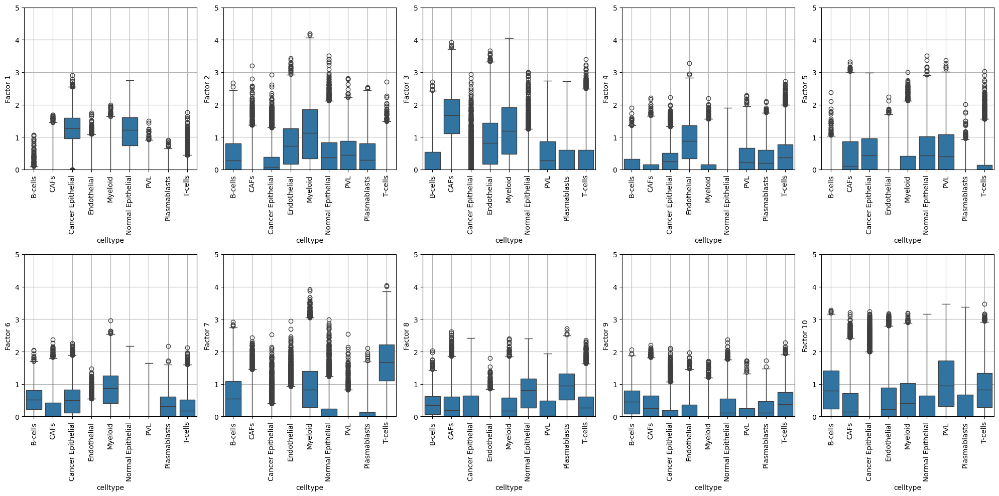

In [210]:
df = pd.concat([z.T, data["group_spatial"]["rna"].obs], axis=1)

fig, axs = plt.subplots(2, 5, figsize=(20, 10))

for i in range(10):
    ax = axs.flatten()[i]
    sns.boxplot(x='celltype', y=f'Factor {i+1}', data=df, ax=ax)
    ax.set_ylim(-0, 5.)
    ax.grid()
    ax.set_xticks(ax.get_xticks())
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90)

plt.tight_layout()

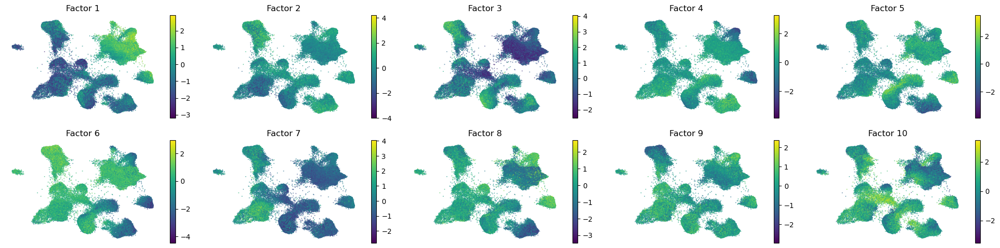

In [211]:
fig, axs = plt.subplots(2, 5, figsize=(20, 5))

for factor in range(10):
    ax = axs.flatten()[factor]
    scatter = ax.scatter(prismo_model.data['group_spatial']['rna'].obsm["X_umap"][:, 0], prismo_model.data['group_spatial']['rna'].obsm["X_umap"][:, 1], s=0.1, c=z.values[factor], cmap="viridis")
    ax.axis("off")
    ax.set_title(f"Factor {factor+1}")
    fig.colorbar(scatter, ax=ax)

plt.tight_layout()

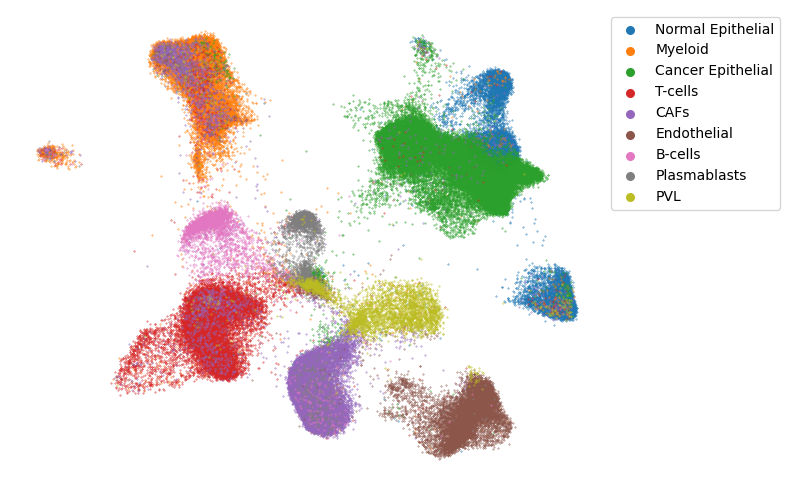

In [213]:
fig, ax = plt.subplots(figsize=(8, 5))

for celltype in prismo_model.data['group_spatial']['rna'].obs["celltype"].unique():
    data_sub = prismo_model.data['group_spatial']['rna'][prismo_model.data['group_spatial']['rna'].obs["celltype"] == celltype]
    ax.scatter(data_sub.obsm["X_umap"][:, 0], data_sub.obsm["X_umap"][:, 1], s=0.1, label=celltype)

ax.axis("off")

legend = ax.legend(bbox_to_anchor=(1., 1.))
legendHandles = legend.legend_handles

for handle in legendHandles:
    handle._sizes = [30]

plt.tight_layout()